In [1]:
from facenet_pytorch import MTCNN
import torch
from torch.utils.data import DataLoader, SubsetRandomSampler
from torch import optim
from torch.optim.lr_scheduler import MultiStepLR
from torch.utils.tensorboard import SummaryWriter
from torchvision import datasets, transforms
import numpy as np
import os
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw
import cv2

sample_file_dict / sample_bbox_dict 로드

In [2]:
import json
# sample_file_source = '/home/jupyter/data/dict/sample_file_dict.txt'
sample_file_source = '/home/jupyter/data/dict/file_dict.txt'
with open(sample_file_source, "r") as f:
    sample_file_dict = json.load(f)
assert len(sample_file_dict) == 95148 # 258

# import json
# bbox_source = '/home/jupyter/data/dict/sample_bbox_dict.txt'
bbox_source = '/home/jupyter/data/dict/bbox_dict.txt'
with open(bbox_source, "r") as f:
    sample_bbox_dict = json.load(f)
assert len(sample_bbox_dict) == 95148 # 258

In [3]:
len(sample_bbox_dict)

258

In [30]:
sample_file_key = list(sample_bbox_dict.keys())[0]
# print(f"sample_key: {sample_file_key}")
print(sample_file_dict[sample_file_key]['image'])
# print(sample_bbox_dict[sample_file_key][0][1:])

/home/jupyter/data/aihub_sample/원천데이터/TS0001/B(외가)/1.Family/F0001_GM_M_D_75-45-18_07.JPG


main

In [3]:
# ground truth bbox
# boxes = sample_bbox_dict[sample_file_key]

def gt_detect(boxes,img=None):
    # img = np.array(img)
    box_label=[]
    for box in boxes:
        x_left = box[1]
        x_right = int(box[1])+int(box[3])
        y_left = box[2]
        y_right = int(box[2])+int(box[4])
        box_=list([int(x_left),int(y_left),int(x_right),int(y_right)])
        box_label.append(box_)
        # 사진에 바운딩 박스 그리기
        # img = cv2.rectangle(img, (int(x_left), int(y_left)), (int(x_right), int(y_right)), 
        #                 (0, 0, 255),3)
    return box_label

In [4]:
def mtcnn_detect(img: np.ndarray) -> np.ndarray:
    boxes, probs = mtcnn.detect(img)
    box_pred=[]
    if boxes is None :
        return box_pred
    for box in boxes:
        x_left = min(box[0], box[2])
        x_right = max(box[0], box[2])
        y_left = min(box[1], box[3])
        y_right = max(box[1], box[3])
        box_area = abs(x_right-x_left)*(y_right-y_left)
        # print(box_area)
        if box_area<5000:
            continue
        # 사진에 바운딩 박스 그리기
        # img = cv2.rectangle(img, (int(x_left), int(y_left)), (int(x_right), int(y_right)), 
        #                     (255, 0, 0),1)
        # 좌표저장
        box_=list([x_left,y_left,x_right,y_right])
        box_pred.append(box_)
    # plt.imshow(img)
    # plt.show()
    # if size :
    #     return x_right-x_left, y_right-y_left
    # else :
    return box_pred

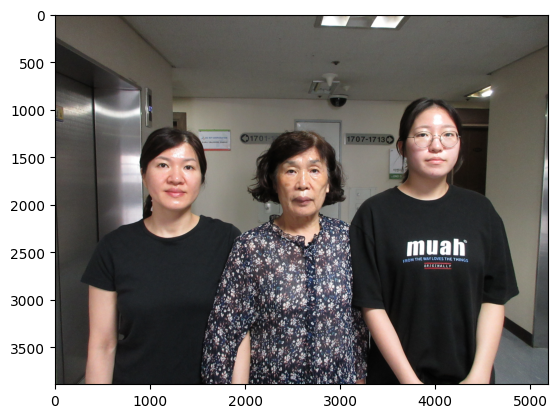

In [8]:
sample_file_key = list(sample_bbox_dict.keys())[1]
img_dir = sample_file_dict[sample_file_key]['image']
img = Image.open(img_dir)
plt.imshow(img)
img = np.array(img)


In [34]:
x=[]
for i in range(len(sample_bbox_dict.keys())):
    sample_file_key = list(sample_bbox_dict.keys())[i]
    for box in sample_bbox_dict[sample_file_key]:
        print(box[1:])
        x.append(box)

['2306', '1283', '822', '822']
['3767', '1278', '767', '767']
['802', '802', '797', '797']
['2213', '1407', '736', '736']
['865', '1358', '717', '717']
['3569', '1028', '724', '724']
['2026', '1105', '718', '718']
['902', '1057', '683', '683']
['3442', '687', '748', '748']
['2222', '1209', '643', '643']
['1161', '1140', '607', '607']
['3469', '827', '660', '660']
['2110', '1306', '812', '812']
['812', '1261', '737', '737']
['3625', '906', '801', '801']
['2024', '1465', '726', '726']
['825', '1424', '672', '672']
['3333', '1094', '681', '681']
['2470', '1333', '783', '783']
['3977', '1314', '748', '748']
['952', '953', '738', '738']
['2191', '1415', '654', '654']
['3345', '1398', '590', '590']
['1032', '1084', '613', '613']
['344', '513', '1165', '1165']
['92', '424', '466', '466']
['203', '505', '1016', '1016']
['158', '253', '801', '801']
['311', '1285', '2167', '2167']
['209', '237', '585', '585']
['314', '487', '479', '479']
['147', '174', '339', '339']
['312', '212', '339', '339']


In [82]:
# ground truth bbox 개수
len(x)

292

In [13]:
# pred 바운딩박스 어떻게 그려졌는지 확인
sample_file_key = list(sample_bbox_dict.keys())[150]
img_dir = sample_file_dict[sample_file_key]['image']
img = Image.open(img_dir)
# plt.imshow(img)
img = np.array(img)
mtcnn_detect(img)

[[43.306965, 86.38553, 344.03033, 484.86636]]

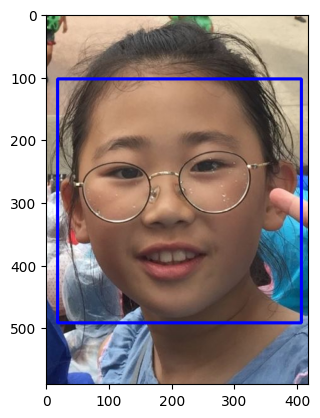

In [14]:
# gt 바운딩박스 어떻게 그려졌는지 확인
img_dir = sample_file_dict[sample_file_key]['image']
img = Image.open(img_dir)
img = np.array(img)
# plt.imshow(img)
# draw = ImageDraw.Draw(img)
# def boxes_labels(img):
for box in sample_bbox_dict[sample_file_key]:
    x_left = box[1]
    x_right = int(box[1])+int(box[3])
    y_left = box[2]
    y_right = int(box[2])+int(box[4])
    img = cv2.rectangle(img, (int(x_left), int(y_left)), (int(x_right), int(y_right)), 
                        (0, 0, 255),3)
    # plt.imshow(img)

plt.imshow(img)

In [23]:
def resize_img_label(image, label, target_size):
    w_orig, h_orig = image.size
    w_target, h_target = target_size
    crop_x, crop_y = label
    image_new = TF.resize(image, target_size)
    label_new = crop_x/w_orig*w_target, crop_y/h_orig*h_target
    return image_new, label_new

In [19]:
def gt_detect(boxes, img=None):
    """
    ground truth의 바운딩 박스 정보(x_좌상단,y_좌상단,x_우하단,y_우하단)를 반환한다.
    """
    box_label = []
    # boxes = sample_bbox_dict[sample_file_key]
    for box in boxes:
        x_left = box[1]
        x_right = int(box[1]) + int(box[3])
        y_left = box[2]
        y_right = int(box[2]) + int(box[4])
        box_ = list([int(x_left), int(y_left), int(x_right), int(y_right)])
        box_label.append(box_)
        # 사진에 바운딩 박스 그리기
        # img = cv2.rectangle(img, (int(x_left), int(y_left)), (int(x_right), int(y_right)),
        #                 (0, 0, 255),3)
    return box_label

In [9]:
sample_bbox_dict[sample_file_key]

[['GM', '1025', '1177', '610', '610'],
 ['M', '3446', '1133', '627', '627'],
 ['D', '2292', '1279', '583', '583']]

In [7]:
def rescale(orig_image, target_size:int, box_label:list, mtcnn=False):
    '''
        orig_image : 원본이미지
        target_size : resize할 이미지 크기(예 : 224 -> 224x224)
        box_label : detect한 bbox 리스트
    '''
    x_orig, y_orig = orig_image.size
    x_scale = 224 / x_orig
    y_scale = 224 / y_orig
    
    image = orig_image.resize((target_size,target_size))
    image = np.array(image)

    orig_image = np.array(orig_image)

    new_box_label=[]
    for box in box_label:
        orig_x_left = box[0]
        orig_y_left = box[1]
        orig_x_right = box[2]
        orig_y_right = box[3]

        re_x_left = int(np.round(orig_x_left*x_scale))
        re_y_left = int(np.round(orig_y_left*y_scale))
        re_x_right = int(np.round(orig_x_right*x_scale))
        re_y_right = int(np.round(orig_y_right*y_scale))
        if mtcnn:
            box_area = (re_x_right-re_x_left)*(re_y_right-re_y_left)
            if box_area<100:
                continue
            box_ = list([re_x_left,re_y_left,re_x_right,re_y_right])
            new_box_label.append(box_)
            # 사진에 pred 바운딩 박스 그리기
            image = cv2.rectangle(image, (re_x_left,re_y_left), (re_x_right,re_y_right),
                                (255, 0, 0),1)
        else :
            box_ = list([re_x_left,re_y_left,re_x_right,re_y_right])
            new_box_label.append(box_)
            # 사진에 gt 바운딩 박스 그리기
            image = cv2.rectangle(image, (re_x_left,re_y_left), (re_x_right,re_y_right),
                                (0, 0, 255),1)
       
    plt.imshow(image)
    plt.show()
    return new_box_label

0.043209876543209874
945
972
825


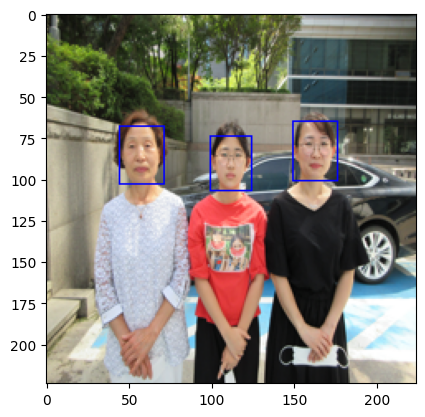

In [26]:
# data resize
import torchvision.transforms.functional as TF
sample_file_key = list(sample_bbox_dict.keys())[124]
img_dir = sample_file_dict[sample_file_key]['image']
image = Image.open(img_dir)
x_orig, y_orig = image.size

target_size = 224
x_scale = 224 / x_orig
y_scale = 224 / y_orig
print(x_scale)
image=image.resize((target_size,target_size))

image = np.array(image)
box_label=[]
for box in gt_detect(sample_bbox_dict[sample_file_key]):
    orig_x_left = box[0]
    orig_y_left = box[1]
    orig_x_right = box[2]
    orig_y_right = box[3]

    re_x_left = int(np.round(orig_x_left*x_scale))
    re_y_left = int(np.round(orig_y_left*y_scale))
    re_x_right = int(np.round(orig_x_right*x_scale))
    re_y_right = int(np.round(orig_y_right*y_scale))
    box_area = (re_x_right-re_x_left)*(re_y_right-re_y_left)
    print(box_area)
    box_ = list([re_x_left,re_y_left,re_x_right,re_y_right])
    box_label.append(box_)
    # 사진에 바운딩 박스 그리기
    image = cv2.rectangle(image, (re_x_left,re_y_left), (re_x_right,re_y_right),
                        (0, 0, 255),1)
    plt.imshow(image)

In [8]:
# data resize
import torchvision.transforms.functional as TF
sample_file_key = list(sample_bbox_dict.keys())[7627]
img_dir = sample_file_dict[sample_file_key]['image']
orig_image = Image.open(img_dir)
x_orig, y_orig = orig_image.size

target_size = 224
x_scale = 224 / x_orig
y_scale = 224 / y_orig

image=orig_image.resize((target_size,target_size))

image = np.array(image)
orig_image = np.array(orig_image)
box_label=[]
for box in mtcnn_detect(orig_image):
    orig_x_left = box[0]
    orig_y_left = box[1]
    orig_x_right = box[2]
    orig_y_right = box[3]

    re_x_left = int(np.round(orig_x_left*x_scale))
    re_y_left = int(np.round(orig_y_left*y_scale))
    re_x_right = int(np.round(orig_x_right*x_scale))
    re_y_right = int(np.round(orig_y_right*y_scale))
    
    box_area = (re_x_right-re_x_left)*(re_y_right-re_y_left)
    print(box_area)
    # if box_area<200:
    #     continue
    box_ = list([re_x_left,re_y_left,re_x_right,re_y_right])
    box_label.append(box_)
    # 사진에 바운딩 박스 그리기
    image = cv2.rectangle(image, (re_x_left,re_y_left), (re_x_right,re_y_right),
                        (255, 0, 0),1)
    plt.imshow(image)


RuntimeError: Given groups=1, weight of size [10, 3, 3, 3], expected input[1, 4, 204, 204] to have 3 channels, but got 4 channels instead

In [56]:
import torch
torch.cuda.empty_cache()

In [8]:
def calc_iou(gt_bbox,pred_bbox):
    '''
    This function takes the predicted bounding box and ground truth bounding box and 
    return the IoU ratio
    '''
    x_topleft_gt, y_topleft_gt, x_bottomright_gt, y_bottomright_gt= gt_bbox
    x_topleft_p, y_topleft_p, x_bottomright_p, y_bottomright_p= pred_bbox
    
    if (x_topleft_gt > x_bottomright_gt) or (y_topleft_gt> y_bottomright_gt):
        raise AssertionError("Ground Truth Bounding Box is not correct")
    if (x_topleft_p > x_bottomright_p) or (y_topleft_p> y_bottomright_p):
        raise AssertionError("Predicted Bounding Box is not correct",x_topleft_p, x_bottomright_p,y_topleft_p,y_bottomright_gt)
        
    #if the GT bbox and predcited BBox do not overlap then iou=0
    if(x_bottomright_gt< x_topleft_p):
        # If bottom right of x-coordinate  GT  bbox is less than or above the top left of x coordinate of  the predicted BBox
        return 0.0
    if(y_bottomright_gt< y_topleft_p):  # If bottom right of y-coordinate  GT  bbox is less than or above the top left of y coordinate of  the predicted BBox
        return 0.0
    if(x_topleft_gt> x_bottomright_p): # If bottom right of x-coordinate  GT  bbox is greater than or below the bottom right  of x coordinate of  the predcited BBox
        return 0.0
    if(y_topleft_gt> y_bottomright_p): # If bottom right of y-coordinate  GT  bbox is greater than or below the bottom right  of y coordinate of  the predcited BBox
        return 0.0
    
    GT_bbox_area = (x_bottomright_gt -  x_topleft_gt + 1) * (  y_bottomright_gt -y_topleft_gt + 1)
    Pred_bbox_area =(x_bottomright_p - x_topleft_p + 1 ) * ( y_bottomright_p -y_topleft_p + 1)
    
    x_top_left =np.max([x_topleft_gt, x_topleft_p])
    y_top_left = np.max([y_topleft_gt, y_topleft_p])
    x_bottom_right = np.min([x_bottomright_gt, x_bottomright_p])
    y_bottom_right = np.min([y_bottomright_gt, y_bottomright_p])
    
    intersection_area = (x_bottom_right- x_top_left + 1) * (y_bottom_right-y_top_left  + 1)
    
    union_area = (GT_bbox_area + Pred_bbox_area - intersection_area)
   
    return intersection_area/union_area + 1e-6

In [9]:
def get_single_image_results(gt_boxes, pred_boxes, iou_thr):
    """Calculates number of true_pos, false_pos, false_neg from single batch of boxes.
    Args:
        gt_boxes (list of list of floats): list of locations of ground truth
            objects as [xmin, ymin, xmax, ymax]
        pred_boxes (dict): dict of dicts of 'boxes' (formatted like `gt_boxes`)
            and 'scores'
        iou_thr (float): value of IoU to consider as threshold for a
            true prediction.
    Returns:
        dict: true positives (int), false positives (int), false negatives (int)
    """
    all_pred_indices= range(len(pred_boxes))
    all_gt_indices=range(len(gt_boxes))
    
    if len(all_pred_indices)==0:
        tp=0
        fp=0
        fn=len(gt_boxes)
        iou=0
        # return {'true_positive':tp, 'false_positive':fp, 'false_negative':fn}
        return tp, fp, fn, iou
    if len(all_gt_indices)==0:
        tp=0
        fp=0
        fn=0
        iou=0
        # return {'true_positive':tp, 'false_positive':fp, 'false_negative':fn}
        return tp, fp, fn, iou
    gt_idx_thr=[]
    pred_idx_thr=[]
    ious=[]
    for ipb, pred_box in enumerate(pred_boxes):
        for igb, gt_box in enumerate(gt_boxes):
            iou= calc_iou(gt_box, pred_box)
            
            if iou >iou_thr:
                gt_idx_thr.append(igb)
                pred_idx_thr.append(ipb)
                ious.append(iou)
    iou_sort = np.argsort(ious)[::1]
   
    # print(gt_idx_thr)
    # print(pred_idx_thr)
    if len(iou_sort)==0:
        tp=0
        fp=1
        fn=1
        # iou=[max(ious_)]
        iou=0
        # return {'true_positive':tp, 'false_positive':fp, 'false_negative':fn}
        return tp, fp, fn, iou
    else:
        gt_match_idx=[]
        pred_match_idx=[]
        for idx in iou_sort:
            gt_idx=gt_idx_thr[idx]
            pr_idx= pred_idx_thr[idx]
            # If the boxes are unmatched, add them to matches
            if(gt_idx not in gt_match_idx) and (pr_idx not in pred_match_idx):
                gt_match_idx.append(gt_idx)
                pred_match_idx.append(pr_idx)
        tp= len(gt_match_idx)
        fp= len(pred_boxes) - len(pred_match_idx)
        fn = len(gt_boxes) - len(gt_match_idx)
        
    return tp, fp, fn, ious

In [5]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
mtcnn = MTCNN(keep_all=True, device=device)
sample_file_key = list(sample_bbox_dict.keys())

/home/jupyter/data/aihub_sample/원천데이터/TS0001/B(외가)/1.Family/F0001_GM_M_D_75-45-18_07.JPG


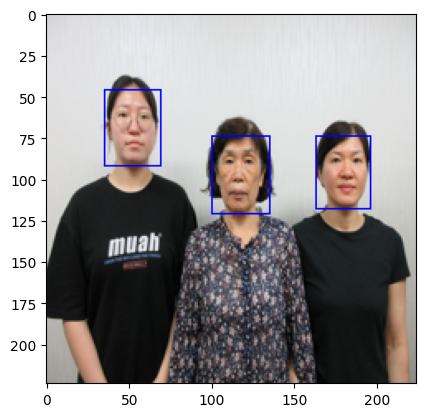

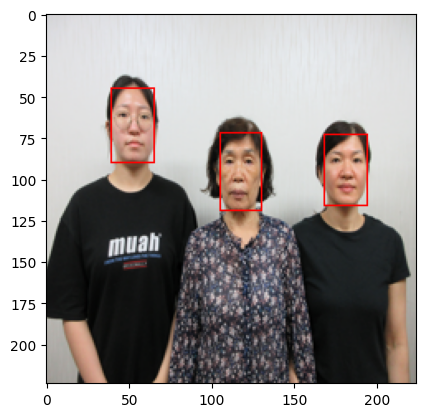

0
/home/jupyter/data/aihub_sample/원천데이터/TS0001/B(외가)/1.Family/F0001_GM_M_D_75-45-18_06.JPG


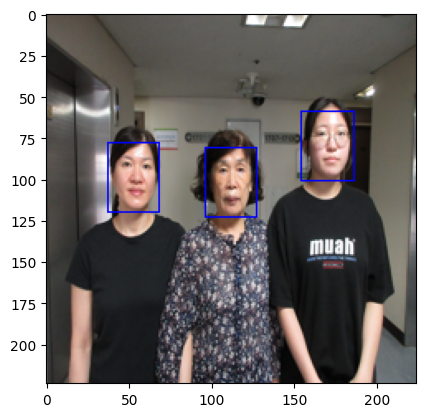

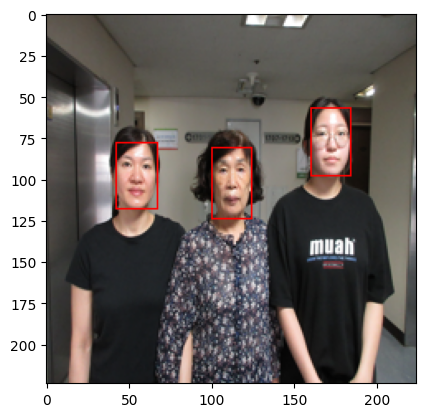

1
/home/jupyter/data/aihub_sample/원천데이터/TS0001/B(외가)/1.Family/F0001_GM_M_D_75-45-18_02.JPG


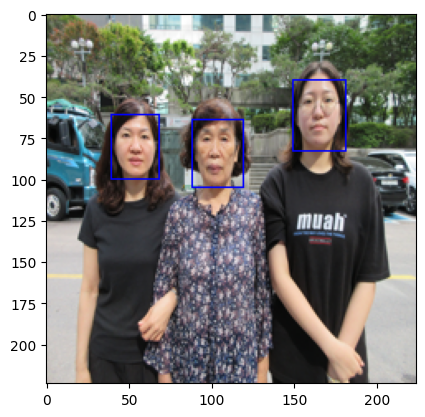

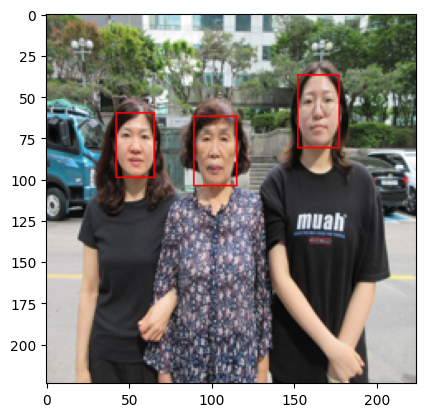

2
/home/jupyter/data/aihub_sample/원천데이터/TS0001/B(외가)/1.Family/F0001_GM_M_D_75-45-18_01.JPG


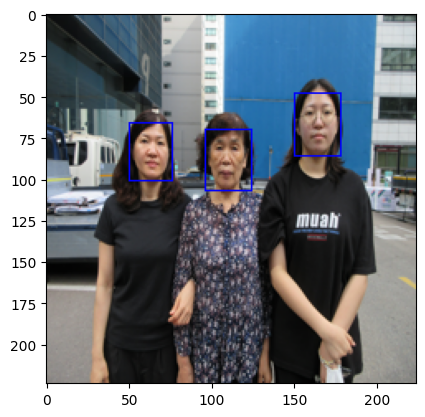

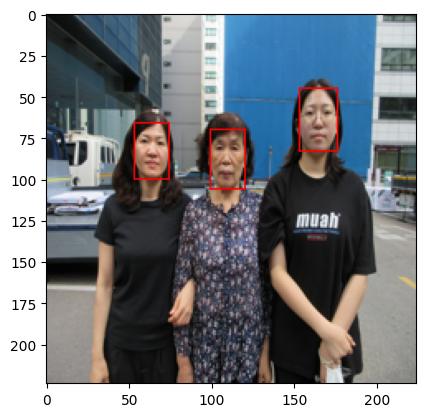

3
/home/jupyter/data/aihub_sample/원천데이터/TS0001/B(외가)/1.Family/F0001_GM_M_D_75-45-18_05.JPG


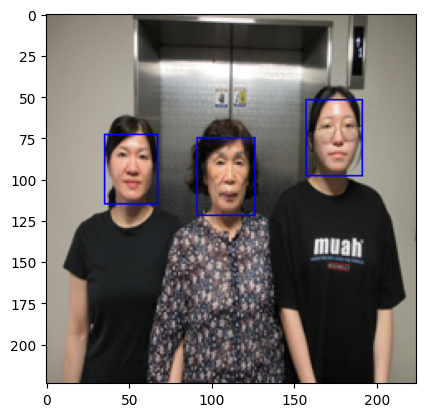

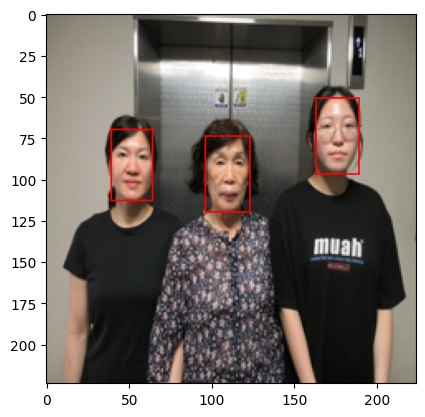

4
{'true_positive': 15, 'false_positive': 0, 'false_negative': 0}
{'precision': 1.0, 'recall': 1.0, 'F1_score': 1.0, 'mIoU': 0.7383157650211604}


In [12]:
import pandas as pd
total_tp=0
total_fp=0
total_fn=0
iou_list=[]
# for i in range(len(sample_bbox_dict.keys())):
for i in range(0,5):
    sample_file_key = list(sample_bbox_dict.keys())[i]
    img_dir = sample_file_dict[sample_file_key]['image']
    print(img_dir)
    orig_image = Image.open(img_dir)
    image=np.array(orig_image)
    # 바운딩 박스 확인 -> gt_detect(..,img) img추가해야함
    # tp, fp, fn, ious = get_single_image_results(gt_detect(sample_bbox_dict[sample_file_key],img),mtcnn_detect(img),iou_thr=0.5)
    gt_box = gt_detect(sample_bbox_dict[sample_file_key])
    pred_box = mtcnn_detect(image)
    tp, fp, fn, ious = get_single_image_results(rescale(orig_image,224,gt_box),rescale(orig_image,224,pred_box,mtcnn=True),iou_thr=0.55)
    # print(ious)
    if ious !=0:
        iou_list.extend(ious)
    total_tp+=tp
    total_fp+=fp
    total_fn+=fn
    
    print(i)
    # print({'true_positive': tp, 'false_positive': fp, 'false_negative': fn})

    # 바운딩 박스 확인하기(GT : blue box, pred : red box)
    # plt.imshow(img)
    # plt.show()
    
precision = total_tp/(total_tp+total_fp)
recall = total_tp/(total_tp+total_fn)
f1_score = 2.0/(1/precision+1/recall)
miou = sum(iou_list)/len(iou_list)
print({'true_positive': total_tp, 'false_positive': total_fp, 'false_negative': total_fn})
print({'precision': precision, 'recall': recall, 'F1_score': f1_score, 'mIoU': miou})

ground truth bbox 개수와 tp+fp 비교

In [58]:
# 이미지마다 ground truth bbox 개수 -> csv파일로 저장
x=pd.DataFrame(columns=['gt_bbox'])

for i in range(len(sample_bbox_dict.keys())):
# for i in range(0,10):
    sample_file_key = list(sample_bbox_dict.keys())[i]
    a=0
    for idx, box in enumerate (sample_bbox_dict[sample_file_key]):
        a=idx+1
    x.loc[i]=a
x.to_csv("gt_bbox.csv",index=False)

In [59]:
x.sum()

gt_bbox    292
dtype: object

In [30]:
import pandas as pd
total_tp=0
total_fp=0
total_fn=0
iou_list=[]
df1=pd.DataFrame(columns=['true_positive', 'false_positive', 'false_negative'])
for i in range(len(sample_bbox_dict.keys())):
# for i in range(30,36):
    sample_file_key = list(sample_bbox_dict.keys())[i]
    img_dir = sample_file_dict[sample_file_key]['image']
    print(img_dir)
    img = Image.open(img_dir)
    img = np.array(img)

    # 바운딩 박스 확인 -> gt_detect(..,img) img추가해야함
    # tp, fp, fn, ious = get_single_image_results(gt_detect(sample_bbox_dict[sample_file_key],img),mtcnn_detect(img),iou_thr=0.5)
    tp, fp, fn, ious = get_single_image_results(gt_detect(sample_bbox_dict[sample_file_key]),mtcnn_detect(img),iou_thr=0.5)
    # print(ious)
    if ious !=0:
        iou_list.extend(ious)
    # total_tp+=tp
    # total_fp+=fp
    # total_fn+=fn
    print(i)
    df1.loc[i]=[tp, fp, fn]
    print({'true_positive': tp, 'false_positive': fp, 'false_negative': fn})
df1.to_csv("pred_bbox.csv",index=False)

    # 바운딩 박스 확인하기(GT : blue box, pred : red box)
    # plt.imshow(img)
    # plt.show()

# precision = total_tp/(total_tp+total_fp)
# recall = total_tp/(total_tp+total_fp)
# f1_score = 2.0/(1/precision+1/recall)
# miou = sum(iou_list)/len(iou_list)
# print({'true_positive': total_tp, 'false_positive': total_fp, 'false_negative': total_fn})
# print({'precision': precision, 'recall': recall, 'F1_score': f1_score, 'mIoU': miou})

/home/jupyter/data/aihub_sample/원천데이터/TS0001/B(외가)/1.Family/F0001_GM_M_D_75-45-18_07.JPG
0
{'true_positive': 3, 'false_positive': 0, 'false_negative': 0}
/home/jupyter/data/aihub_sample/원천데이터/TS0001/B(외가)/1.Family/F0001_GM_M_D_75-45-18_06.JPG
1
{'true_positive': 3, 'false_positive': 0, 'false_negative': 0}
/home/jupyter/data/aihub_sample/원천데이터/TS0001/B(외가)/1.Family/F0001_GM_M_D_75-45-18_02.JPG
2
{'true_positive': 3, 'false_positive': 0, 'false_negative': 0}
/home/jupyter/data/aihub_sample/원천데이터/TS0001/B(외가)/1.Family/F0001_GM_M_D_75-45-18_01.JPG
3
{'true_positive': 3, 'false_positive': 0, 'false_negative': 0}
/home/jupyter/data/aihub_sample/원천데이터/TS0001/B(외가)/1.Family/F0001_GM_M_D_75-45-18_05.JPG
4
{'true_positive': 3, 'false_positive': 1, 'false_negative': 0}
/home/jupyter/data/aihub_sample/원천데이터/TS0001/B(외가)/1.Family/F0001_GM_M_D_75-45-18_04.JPG
5
{'true_positive': 3, 'false_positive': 0, 'false_negative': 0}
/home/jupyter/data/aih

In [10]:
# ground truth bbox 개수확인
gt=pd.read_csv('gt_bbox.csv')
pr=pd.read_csv('pred_bbox.csv')
result=pd.concat([gt,pr],axis=1)
result.to_csv("result.csv")

In [35]:
result

,gt_bbox,true_positive,false_positive,false_negative,pred_bbox
0,3,3,0,0,3
1,3,3,0,0,3
2,3,3,0,0,3
3,3,3,0,0,3
4,3,3,1,0,4
...,...,...,...,...,...
253,1,1,0,0,1
254,1,1,0,0,1
255,1,1,0,0,1
256,1,1,0,0,1


In [11]:
result['pred_bbox']=result['true_positive']+result['false_negative']
diff_list=[]
for i in range(len(result)):
    if result.loc[i]['gt_bbox'] != result.loc[i]['pred_bbox']:
        diff_list.append(i)

In [12]:
diff_list

[4,
 7,
 14,
 33,
 35,
 48,
 59,
 76,
 108,
 109,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 187,
 201,
 202,
 205,
 211,
 233,
 235]

In [52]:
result1=pd.DataFrame(columns=result.columns)
for i in diff_list:
    result1.loc[i]=result.loc[i]
result1.to_csv("result1.csv",index=False)

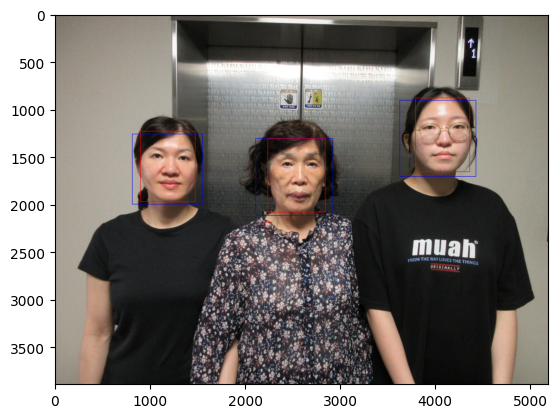

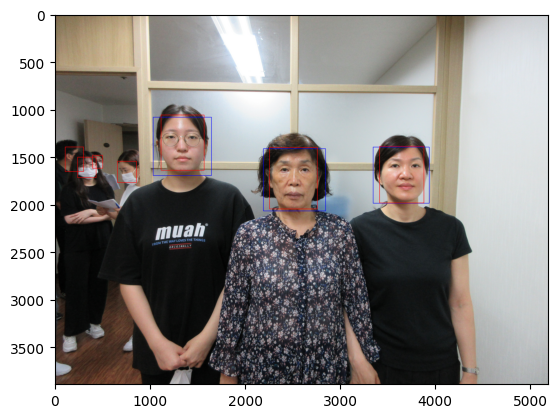

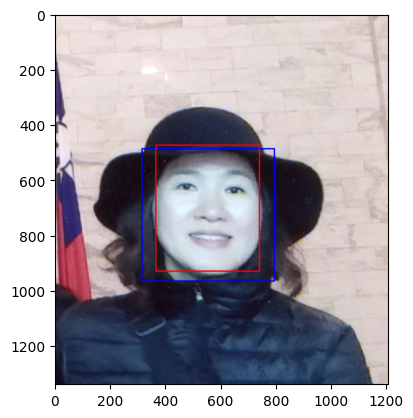

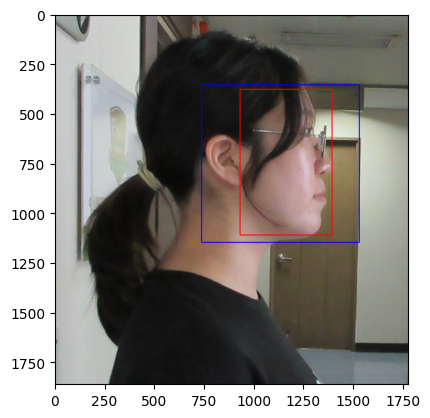

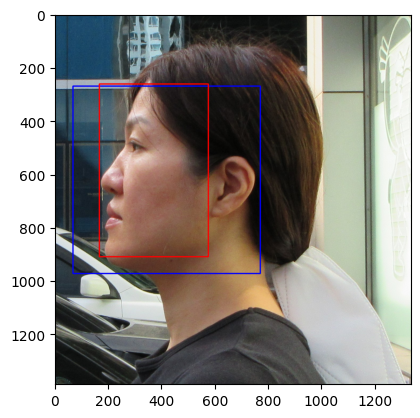

...

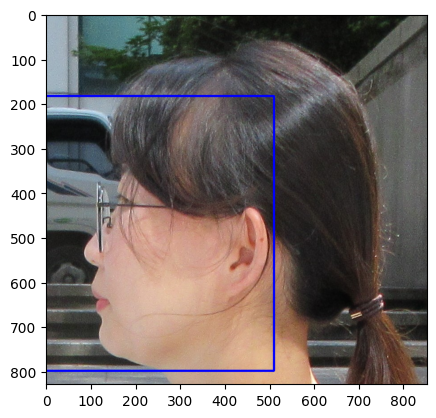

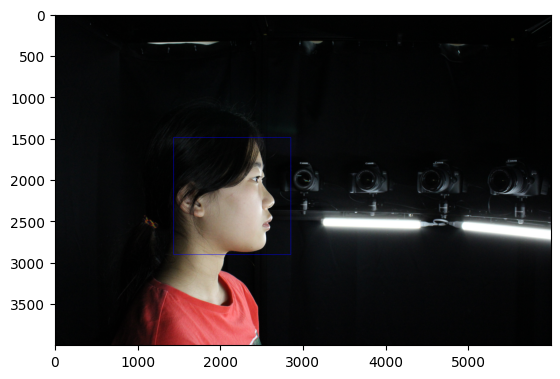

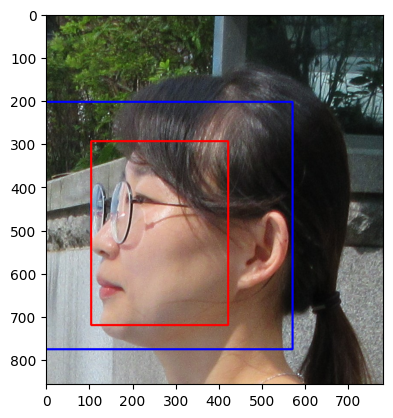

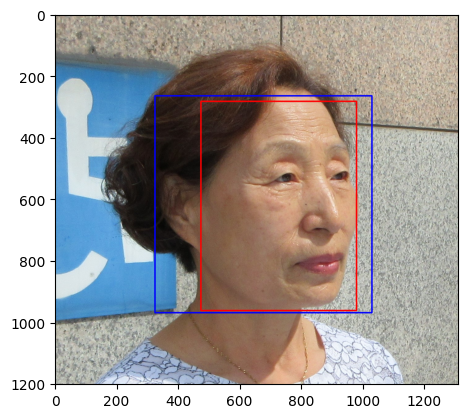

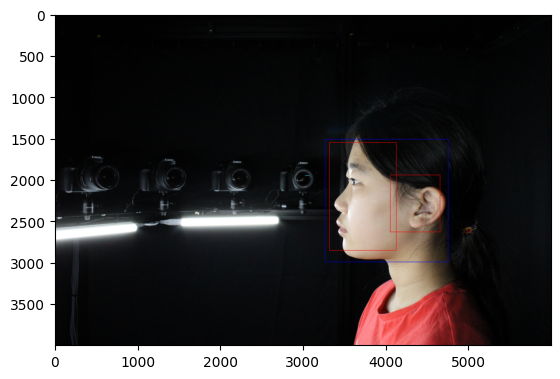

In [50]:
for i in diff_list:
    # 라벨링데이터이용해 바운딩박스그리기
    sample_file_key = list(sample_bbox_dict.keys())[i]
    img_dir = sample_file_dict[sample_file_key]['image']
    img = Image.open(img_dir)
    img = np.array(img)
    # plt.imshow(img)
    # draw = ImageDraw.Draw(img)
    # def boxes_labels(img):
    for box in sample_bbox_dict[sample_file_key]:
        x_left = box[1]
        x_right = int(box[1])+int(box[3])
        y_left = box[2]
        y_right = int(box[2])+int(box[4])
        img = cv2.rectangle(img, (int(x_left), int(y_left)), (int(x_right), int(y_right)), 
                            (0, 0, 255),3)
        # plt.imshow(img)

    mtcnn_detect(img)
    plt.imshow(img)
    plt.show()

In [132]:
print(iou_list)

[0.6696790128701775, 0.6890897968285589, 0.7450047823898687, 0.7445833923772373, 0.7019264431409339, 0.7465023074317649, 0.7691982895238263, 0.6992282143231329, 0.7509164288046783, 0.7028789376050559, 0.7263356791881355, 0.7550865992444781, 0.7137621646300505, 0.7079343585666433, 0.7340458000596944, 0.716999307215657, 0.7527683470081874, 0.7046702352567232, 0.7353123467997885, 0.7602840149857316, 0.7087909303252546, 0.7351566844566825, 0.6932857373598164, 0.7467529981549708, 0.6660665667751425, 0.7589727583061179, 0.7118319178338971, 0.6419412536632858, 0.7436510029231496, 0.6743759740606075, 0.7111323739771186, 0.6857125693842065, 0.72735503772816, 0.6626176436844833, 0.5943868227710709, 0.6694549437700513, 0.6747190316536474, 0.6131281051743048, 0.5938341054077849, 0.6576460820482342, 0.7263137583828151, 0.7264607195529459, 0.6736191815130005, 0.5662349376180913, 0.6550126036148859, 0.7619304896472417, 0.7802051792396368, 0.7110557858624083, 0.7048637286453058, 0.6576303816162916, 0.

In [133]:
acc=total_tp/309
print(acc)

0.9093851132686084


IoU Threshold에 따른 결과값

In [69]:
import pandas as pd
total_tp=0
total_fp=0
total_fn=0
iou_list=[]
#0.85부터 인식x
threshold=[0.5,0.55,0.6,0.65,0.7,0.75,0.8,0.85]
df = pd.DataFrame(columns=['Threshold','precision','recall','F1_score','mIoU'])
for idx, thr in enumerate(threshold):
    for i in range(len(sample_bbox_dict.keys())):
    # for i in range(30,36):
        sample_file_key = list(sample_bbox_dict.keys())[i]
        img_dir = sample_file_dict[sample_file_key]['image']
        # print(img_dir)
        img = Image.open(img_dir)
        img = np.array(img)

        
        tp, fp, fn, ious = get_single_image_results(gt_detect(sample_bbox_dict[sample_file_key]),mtcnn_detect(img),iou_thr=thr)
        # print(ious)
        if ious !=0:
            iou_list.extend(ious)
        total_tp+=tp
        total_fp+=fp
        total_fn+=fn
        # print(i)
    if total_tp == 0:
        precision=0
        recall=0
        f1_score=0
        miou=0
    else:
        precision = total_tp/(total_tp+total_fp)
        recall = total_tp/(total_tp+total_fn)
        f1_score = 2.0/(1/precision+1/recall)
        miou = sum(iou_list)/len(iou_list)
    
    df.loc[idx]=[thr, precision, recall, f1_score, miou]
    print({'true_positive': total_tp, 'false_positive': total_fp, 'false_negative': total_fn})
    print({'precision': precision, 'recall': recall, 'F1_score': f1_score, 'mIoU': miou})
    total_tp=0
    total_fp=0
    total_fn=0

{'true_positive': 281, 'false_positive': 37, 'false_negative': 11}
{'precision': 0.8836477987421384, 'recall': 0.9623287671232876, 'F1_score': 0.9213114754098362, 'mIoU': 0.6695571724072017}
{'true_positive': 264, 'false_positive': 52, 'false_negative': 28}
{'precision': 0.8354430379746836, 'recall': 0.9041095890410958, 'F1_score': 0.8684210526315789, 'mIoU': 0.6738813119284504}
{'true_positive': 234, 'false_positive': 82, 'false_negative': 58}
{'precision': 0.740506329113924, 'recall': 0.8013698630136986, 'F1_score': 0.7697368421052632, 'mIoU': 0.6792231875525597}
{'true_positive': 185, 'false_positive': 131, 'false_negative': 107}
{'precision': 0.5854430379746836, 'recall': 0.6335616438356164, 'F1_score': 0.6085526315789473, 'mIoU': 0.6850811238056977}
{'true_positive': 110, 'false_positive': 205, 'false_negative': 182}
{'precision': 0.3492063492063492, 'recall': 0.3767123287671233, 'F1_score': 0.3624382207578254, 'mIoU': 0.6902448811026552}
{'true_positive': 33, 'false_positive': 25

In [70]:
df.to_csv("iou_thr_result.csv")

In [71]:
df

,Threshold,precision,recall,F1_score,mIoU
0,0.50,0.883648,0.962329,0.921311,0.669557
1,0.55,0.835443,0.904110,0.868421,0.673881
2,0.60,0.740506,0.801370,0.769737,0.679223
3,0.65,0.585443,0.633562,0.608553,0.685081
4,0.70,0.349206,0.376712,0.362438,0.690245
5,0.75,0.114583,0.118705,0.116608,0.692502
6,0.80,0.003906,0.003876,0.003891,0.692611
7,0.85,0.000000,0.000000,0.000000,0.000000
